# Multi-temporal prediction using DeepForest

The goal of this notebook is to explore consensus prediction of individual tree crowns from multiple views of the same forest over time

In [16]:
import tensorflow as tf
from deepforest import deepforest
from deepforest import predict
import cv2
from matplotlib import pyplot
from keras_retinanet.utils import image as keras_retinanet_image
import numpy as np
import pandas as pd
from keras_retinanet.utils.visualization import draw_box

In [2]:
model = deepforest.deepforest()
model.use_release()

Reading config file: deepforest_config.yml
A blank deepforest object created. To perform prediction, either train or load an existing model.
Model from DeepForest release https://github.com/weecology/DeepForest/releases/tag/v0.2.1 was already downloaded. Loading model from file.
Loading pre-built model: https://github.com/weecology/DeepForest/releases/tag/v0.2.1

tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_1:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_2:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_3:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_4:0' shape=(9, 4) dtype=float32> anchors
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


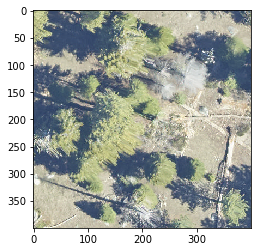

In [3]:
i2019 = cv2.imread("/Users/ben/Dropbox/Weecology/multiyear/eval/images/2019/TEAK_049.tif")
pyplot.imshow(i2019[:,:,::-1])

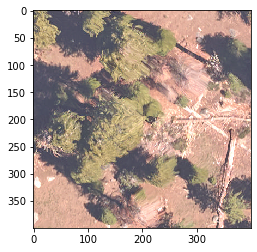

In [4]:
i2018 = cv2.imread("/Users/ben/Dropbox/Weecology/multiyear/eval/images/2018/TEAK_049.tif")
pyplot.imshow(i2018[:,:,::-1])

## Single Year Predictions

In [5]:
p2018=model.predict_image(numpy_image=i2018,return_plot=True)
p2019=model.predict_image(numpy_image=i2019,return_plot=True)

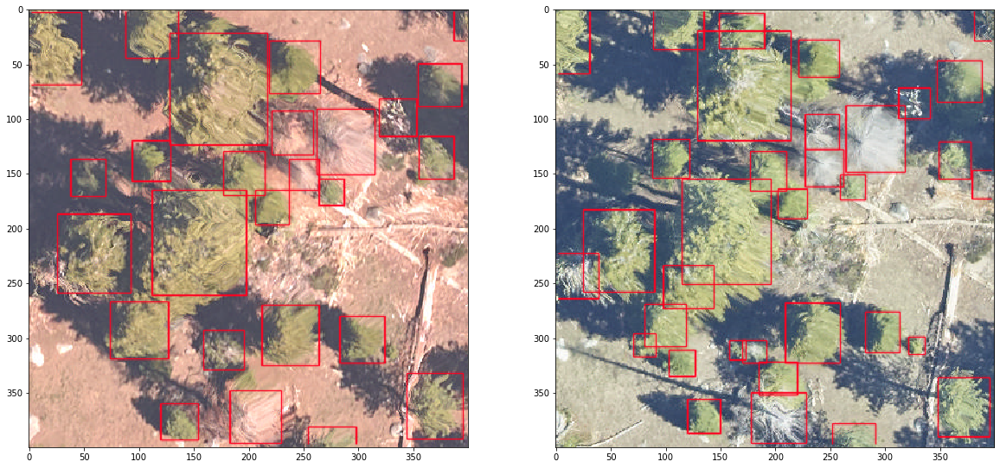

In [7]:
fig, ax =pyplot.subplots(1,2,figsize=(20,10))
ax[0].imshow(p2018[:,:,::-1])
ax[1].imshow(p2019[:,:,::-1])

In [8]:
b2018=model.predict_image(numpy_image=i2018,return_plot=False)
b2018.shape

(26, 6)

In [9]:
b2019=model.predict_image(numpy_image=i2019,return_plot=False)
b2019.shape

(34, 6)

In [12]:
predicted_boxes = pd.concat([b2018,b2019])
#combine data and run non-max suppression
print("{} predictions in overlapping windows, applying non-max suppression".
      format(predicted_boxes.shape[0]))

#tensorflow sessions
sess = tf.Session()
new_boxes, new_scores, new_labels = predict.non_max_suppression(
    sess,
    predicted_boxes[["xmin", "ymin", "xmax", "ymax"]].values,
    predicted_boxes.score.values,
    predicted_boxes.label.values,
    max_output_size=predicted_boxes.shape[0],
    iou_threshold=0.1)

#Recreate box dataframe
image_detections = np.concatenate([
    new_boxes,
    np.expand_dims(new_scores, axis=1),
    np.expand_dims(new_labels, axis=1)
],axis=1)

mosaic_df = pd.DataFrame(
    image_detections,
    columns=["xmin", "ymin", "xmax", "ymax", "score", "label"])
mosaic_df.label = mosaic_df.label.str.decode("utf-8")

print("{} predictions kept after non-max suppression".format(
    mosaic_df.shape[0]))

60 predictions in overlapping windows, applying non-max suppression
33 predictions kept after non-max suppression


# View joint predictions on each year

In [22]:
i2018_joint = i2018.copy()
for box in mosaic_df[["xmin", "ymin", "xmax", "ymax"]].values:
    draw_box(i2018_joint, box, [0, 0, 255])
i2019_joint = i2019.copy()
for box in mosaic_df[["xmin", "ymin", "xmax", "ymax"]].values:
    draw_box(i2019_joint, box, [0, 0, 255])

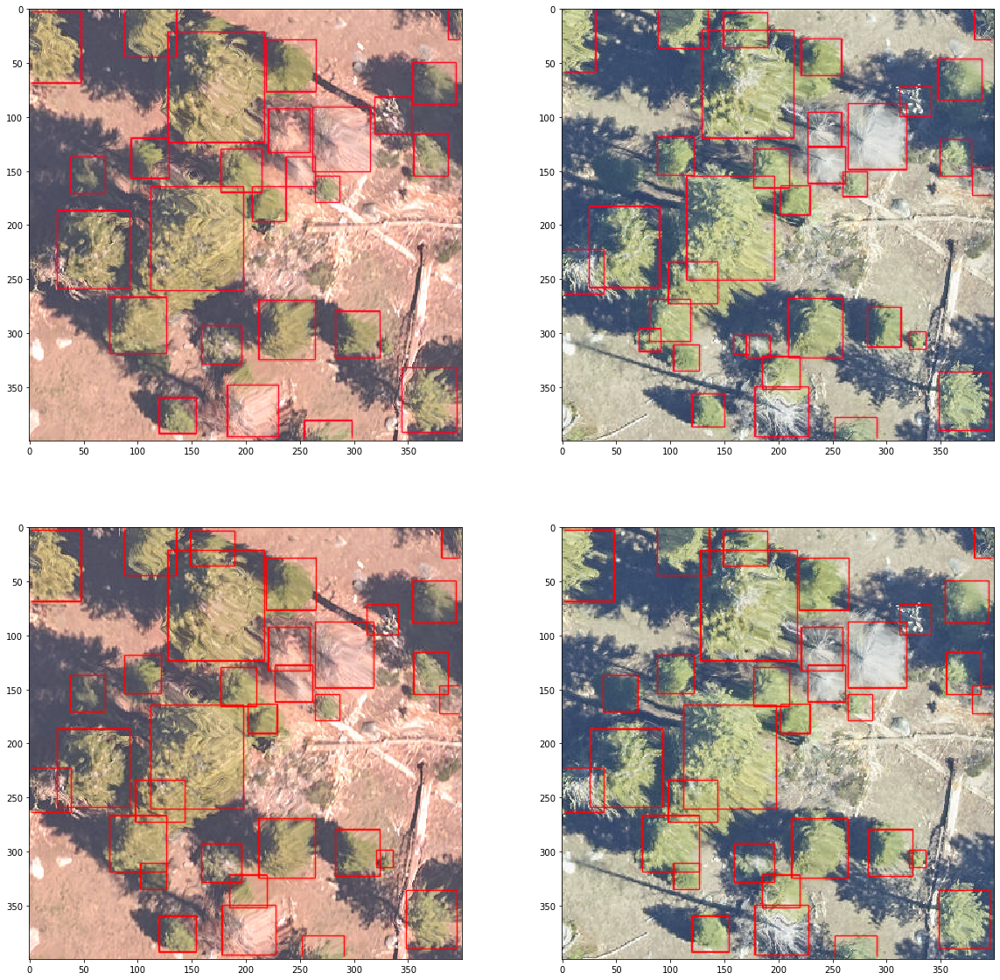

In [23]:
fig, ax =pyplot.subplots(2,2,figsize=(20,20))
ax=ax.flatten()
ax[0].imshow(p2018[:,:,::-1])
ax[1].imshow(p2019[:,:,::-1])
ax[2].imshow(i2018_joint[:,:,::-1])
ax[3].imshow(i2019_joint[:,:,::-1])

## Wrap into a big function and test on a few cases

In [36]:

def view_temporal(image2019_path,image2018_path):
    #Load
    i2019 = cv2.imread(image2019_path)
    i2018 = cv2.imread(image2018_path)

    #predict single
    p2018=model.predict_image(numpy_image=i2018,return_plot=True)
    p2019=model.predict_image(numpy_image=i2019,return_plot=True)

    #get boxes
    b2018=model.predict_image(numpy_image=i2018,return_plot=False)
    b2019=model.predict_image(numpy_image=i2019,return_plot=False)

    #merge
    predicted_boxes = pd.concat([b2018,b2019])
    #combine data and run non-max suppression
    print("{} predictions in overlapping windows, applying non-max suppression".
      format(predicted_boxes.shape[0]))

    #tensorflow sessions
    sess = tf.Session()
    new_boxes, new_scores, new_labels = predict.non_max_suppression(
        sess,
        predicted_boxes[["xmin", "ymin", "xmax", "ymax"]].values,
        predicted_boxes.score.values,
        predicted_boxes.label.values,
        max_output_size=predicted_boxes.shape[0],
        iou_threshold=0.1)

    #Recreate box dataframe
    image_detections = np.concatenate([
        new_boxes,
        np.expand_dims(new_scores, axis=1),
        np.expand_dims(new_labels, axis=1)
        ],axis=1)

    mosaic_df = pd.DataFrame(
    image_detections,
    columns=["xmin", "ymin", "xmax", "ymax", "score", "label"])
    mosaic_df.label = mosaic_df.label.str.decode("utf-8")

    print("{} predictions kept after non-max suppression".format(
    mosaic_df.shape[0]))

    i2018_joint = i2018.copy()
    for box in mosaic_df[["xmin", "ymin", "xmax", "ymax"]].values:
        draw_box(i2018_joint, box, [0, 0, 255])
    i2019_joint = i2019.copy()
    for box in mosaic_df[["xmin", "ymin", "xmax", "ymax"]].values:
        draw_box(i2019_joint, box, [0, 0, 255])

    fig, ax =pyplot.subplots(2,2,figsize=(20,20))
    ax=ax.flatten()
    ax[0].imshow(p2018[:,:,::-1])
    ax[0].title.set_text("Before: 2018")
    ax[1].imshow(p2019[:,:,::-1])
    ax[1].title.set_text("Before: 2019")
    ax[2].imshow(i2018_joint[:,:,::-1])
    ax[2].title.set_text("After: 2018")
    ax[3].imshow(i2019_joint[:,:,::-1])  
    ax[3].title.set_text("After: 2019")


94 predictions in overlapping windows, applying non-max suppression
56 predictions kept after non-max suppression


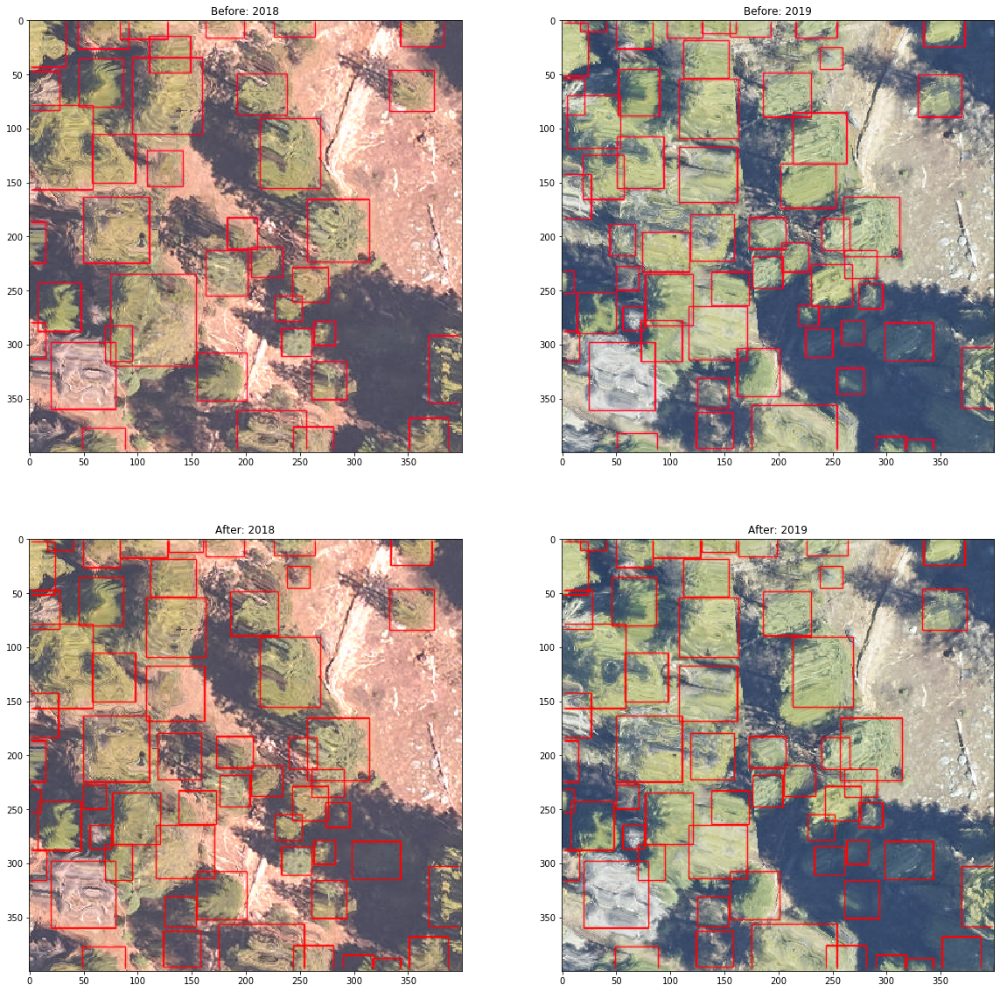

In [37]:
view_temporal("/Users/ben/Dropbox/Weecology/multiyear/eval/images/2019/TEAK_047.tif",
             "/Users/ben/Dropbox/Weecology/multiyear/eval/images/2018/TEAK_047.tif")

132 predictions in overlapping windows, applying non-max suppression
81 predictions kept after non-max suppression


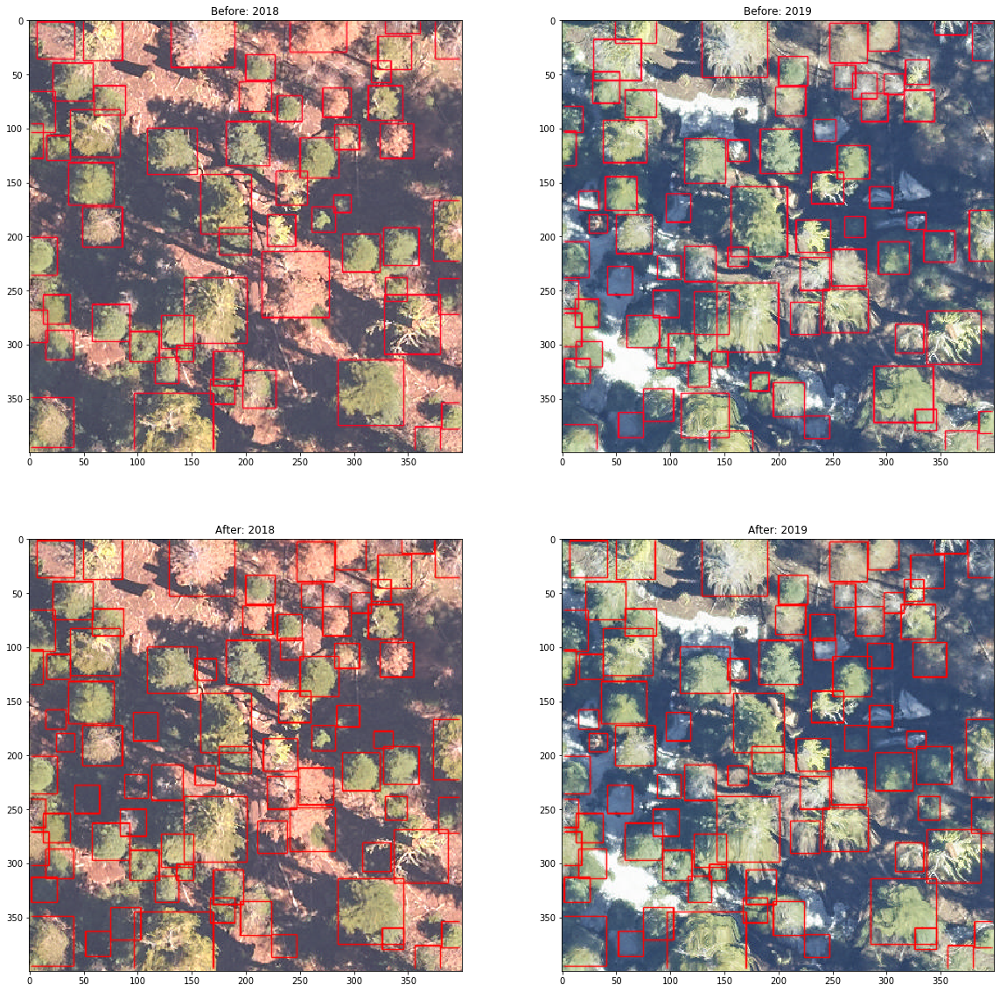

In [38]:
view_temporal("/Users/ben/Dropbox/Weecology/multiyear/eval/images/2019/TEAK_059.tif",
             "/Users/ben/Dropbox/Weecology/multiyear/eval/images/2018/TEAK_059.tif")

76 predictions in overlapping windows, applying non-max suppression
44 predictions kept after non-max suppression


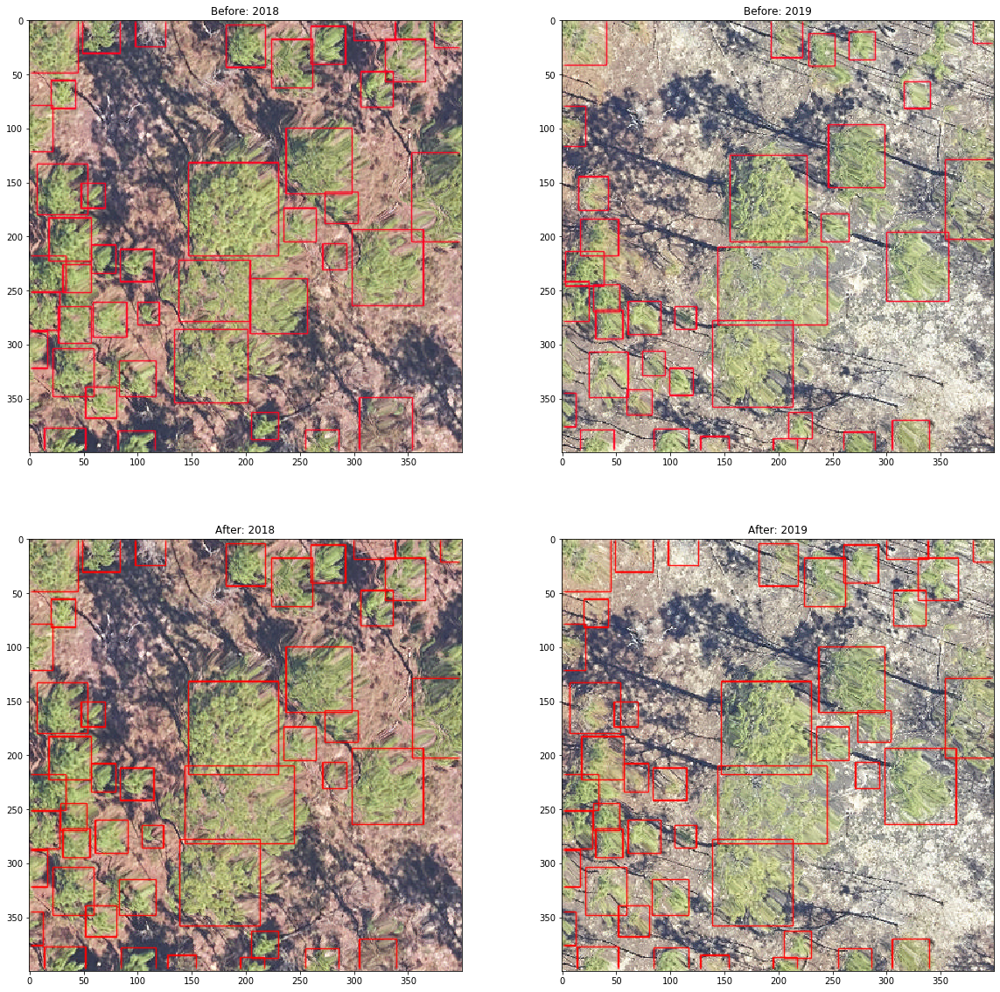

In [39]:
view_temporal("/Users/ben/Dropbox/Weecology/multiyear/eval/images/2019/OSBS_040.tif",
             "/Users/ben/Dropbox/Weecology/multiyear/eval/images/2018/OSBS_040.tif")